In [1]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
import GraphHelpers as GH
%matplotlib inline

In [2]:
RawDataFiles = []
fileLoc =  'K:\CPDiary\Electronic Data Systems\Programs and Data\L&P\IR temperature\Temperature data'
for File in os.listdir(fileLoc):
    if File.endswith('.xlsx'):
        RawDataFiles.append(os.path.join(fileLoc, File))
    

In [3]:
RawDataFiles[32]

'K:\\CPDiary\\Electronic Data Systems\\Programs and Data\\L&P\\IR temperature\\Temperature data\\L&P IR 23-12-13.xlsx'

In [4]:
RawDataFrames = []
for file in RawDataFiles:
    chunk = pd.read_excel(file,skiprows=[0,2,3],index_col='TIMESTAMP')
    RawDataFrames.append(chunk)

In [5]:
RawData = RawDataFrames[0]
for frame in RawDataFrames[1:]:
    RawData = pd.concat([RawData,frame],sort = True)

In [6]:
RawData.sort_index(axis=0,inplace=True)
RawData.drop_duplicates(inplace=True)

In [56]:
IndexData = pd.read_excel('.\IndexFiles\TemperatureAndRadiation.xlsx',index_col='ColumnHeader')
TransposedData = pd.concat([IndexData,RawData.transpose()],axis=1,sort=True)
TransposedData.set_index(['Measurement','Species','Irrigation','Block'],inplace=True)
Data = TransposedData.transpose()
Data.drop(['Units','Summary','Plot','Treatment'],inplace=True)
GH.SortFrame(Data)
Data.index = pd.to_datetime(Data.index)
mask = Data.applymap(lambda x: isinstance(x, (int, float)))
Data.where(mask,other=np.nan,inplace=True)
for col in Data.columns:
    Data.loc[:,col] = pd.to_numeric(Data.loc[:,col])

## Check of met data against broadfields showed the datalogger was on daylight savings time.  Need to adjust index

In [57]:
Data.index = Data.index - datetime.timedelta(hours=1)

## Set up graphing properties

In [9]:
GPs = GH.SetGraphicsPatterns(Data.IR_SurfaceTemp.columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['red','blue','green','orange'])

Species
['Lucerne', 'Ryegrass']
Irrigation
['Dry', 'High', 'Low', 'Mid']
Treatments
MultiIndex(levels=[['Lucerne', 'Ryegrass'], ['Dry', 'High', 'Low', 'Mid']],
           labels=[[0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 2, 3, 0, 1, 2, 3]])
Styles
[('-', 'red', 0.15, 'o'), ('-', 'blue', 0.15, 'o'), ('-', 'green', 0.15, 'o'), ('-', 'orange', 0.15, 'o'), ('--', 'red', 0.45, '^'), ('--', 'blue', 0.45, '^'), ('--', 'green', 0.45, '^'), ('--', 'orange', 0.45, '^')]
StyleFrame
              Lin     Col   Alp Mar     MFC
Lucerne  Dry    -     red  0.15   o     red
         High   -    blue  0.15   o    blue
         Low    -   green  0.15   o   green
         Mid    -  orange  0.15   o  orange
Ryegrass Dry   --     red  0.45   ^   white
         High  --    blue  0.45   ^   white
         Low   --   green  0.45   ^   white
         Mid   --  orange  0.45   ^   white


### Work out how long our date series in in weeks

In [10]:
from datetime import timedelta #Import function needed for doing date deltas 
FirstMeasurement  = Data.index.min()
LastMeasurement = Data.index.max()
Duration = (LastMeasurement - FirstMeasurement)/timedelta(weeks=1)
ExptDuration = np.round(Duration,decimals=0) #weeks
ExptDuration

88.0

## There was a period where some sensors went skew.  This was becasue a mux go wet.  Remove this dud data

In [11]:
TreatsWithProblem = [('IR_SurfaceTemp','Lucerne','Dry','1'),('IR_SurfaceTemp','Lucerne','Dry','2'),
                     ('IR_SurfaceTemp','Lucerne','High','1'),('IR_SurfaceTemp','Lucerne','Low','1'),
                     ('IR_SurfaceTemp','Lucerne','Low','2'),('IR_SurfaceTemp','Lucerne','Low','4'),
                     ('IR_SurfaceTemp','Lucerne','Mid','1'),('IR_SurfaceTemp','Lucerne','Mid','2'),
                     ('IR_SurfaceTemp','Ryegrass','Dry','2'),('IR_SurfaceTemp','Ryegrass','Dry','3'),
                     ('IR_SurfaceTemp','Ryegrass','High','1'),('IR_SurfaceTemp','Ryegrass','High','2'),
                     ('IR_SurfaceTemp','Ryegrass','Low','1'),('IR_SurfaceTemp','Ryegrass','Low','2'),
                     ('IR_SurfaceTemp','Ryegrass','Low','3'),('IR_SurfaceTemp','Ryegrass','Mid','4')]
StartOfProblems = '2012-11-02'
EndOfProblems = '2012-11-09'
Data.loc[StartOfProblems:EndOfProblems,TreatsWithProblem] = np.nan

### Graph data in two weekly blocks to see how it looks

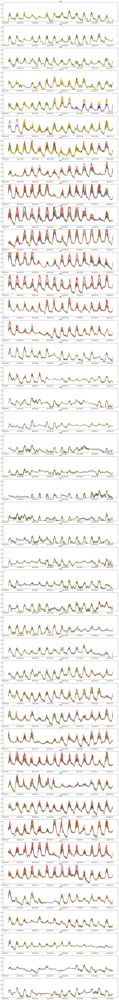

In [12]:
ExptDuration = np.round(Duration,decimals=0) #weeks
def MakeGraph(DataFrame,ymax,ymin):
    PlotDuration = 2
    Pannels = np.int(ExptDuration/PlotDuration)
    #Create a figure object
    for X in range (0,Pannels):
        if (X == 0):
            StartDate = Data.index.min()  #Set start of series at start of data
        else: 
            StartDate = StartDate + timedelta(weeks=PlotDuration)    #increment start date by a week
        StartDateString = StartDate.strftime("%Y-%m-%d")  #Turn this to a string
        EndDate = StartDate + timedelta(weeks=PlotDuration)       #Set start date the specified duration before the end date 
        EndDateString = EndDate.strftime("%Y-%m-%d")           #Turn that into a string
        Position = X+1;
        ax = Fig.add_subplot(Pannels,1,Position)
        GH.AddIndexedPlot(DataFrame.loc[StartDate:EndDate,:],ax,GPs,1)
        plt.title('Test', fontsize=12);
        plt.ylim(ymin,ymax)
        
Fig = plt.figure(figsize=(18, 160))
MakeGraph(Data.IR_SurfaceTemp,45,0)

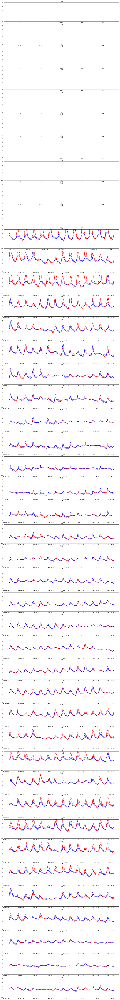

In [13]:
Fig = plt.figure(figsize=(18, 160))
MakeGraph(Data.SurfaceSoilTemp.dropna(),40,-10)

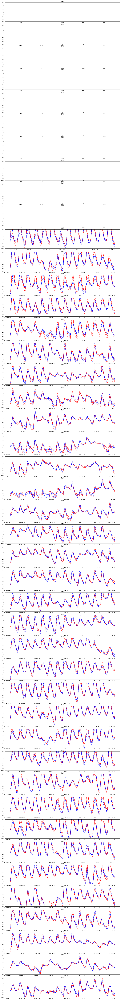

In [14]:
Fig = plt.figure(figsize=(18, 160))
MakeGraph(Data.HeatFlux.dropna(),10,-10)

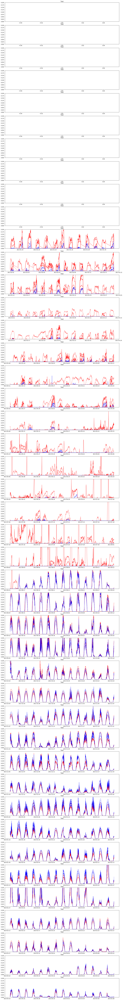

In [15]:
Fig = plt.figure(figsize=(18, 160))
MakeGraph(Data.ReflectedRadnKW.dropna(),0.2,0)


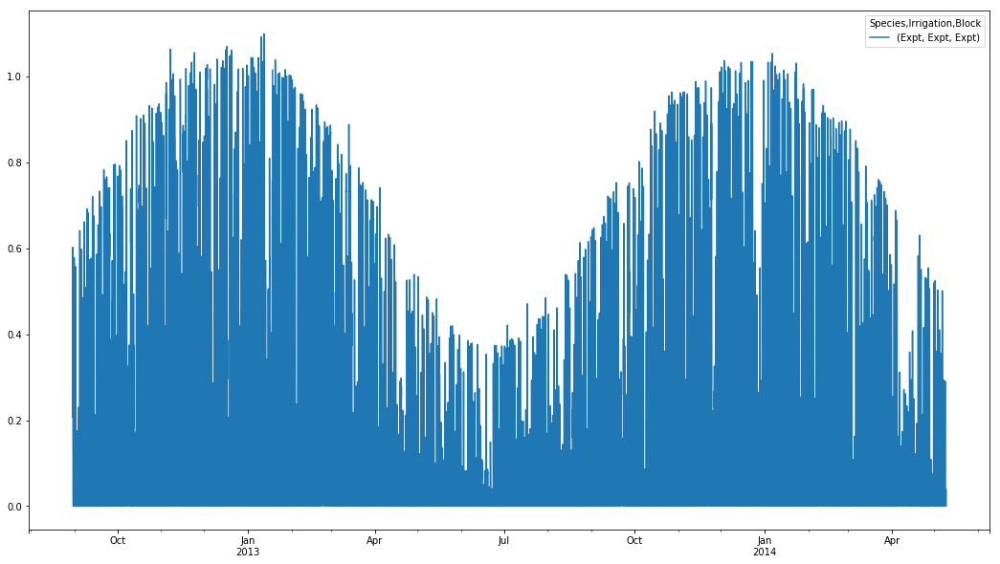

In [58]:
Data.IncomingRadnKW.resample('H').mean().plot(figsize = (18,10))

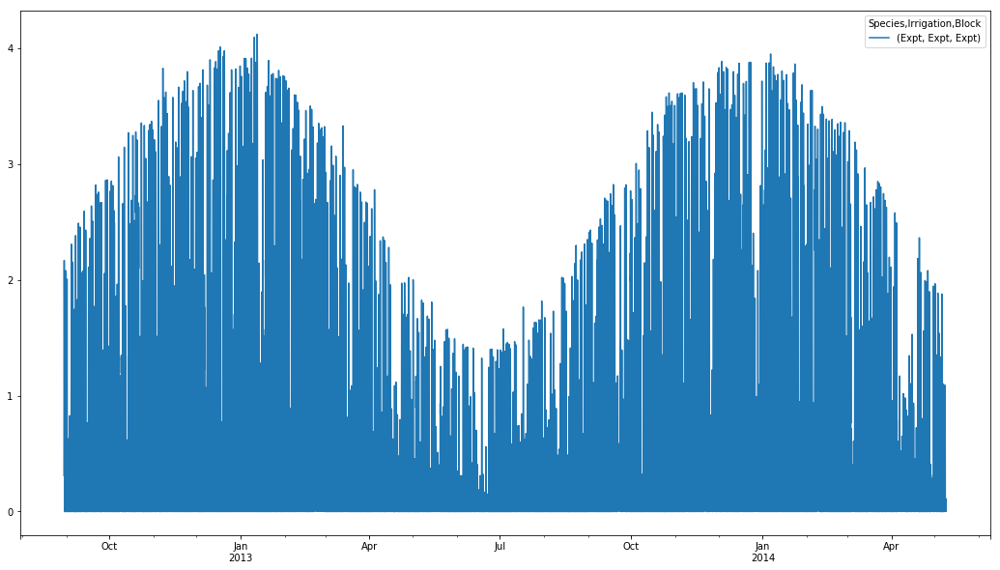

In [64]:
Data.IncomingRadnMJ.resample('H').sum().plot(figsize = (18,10))

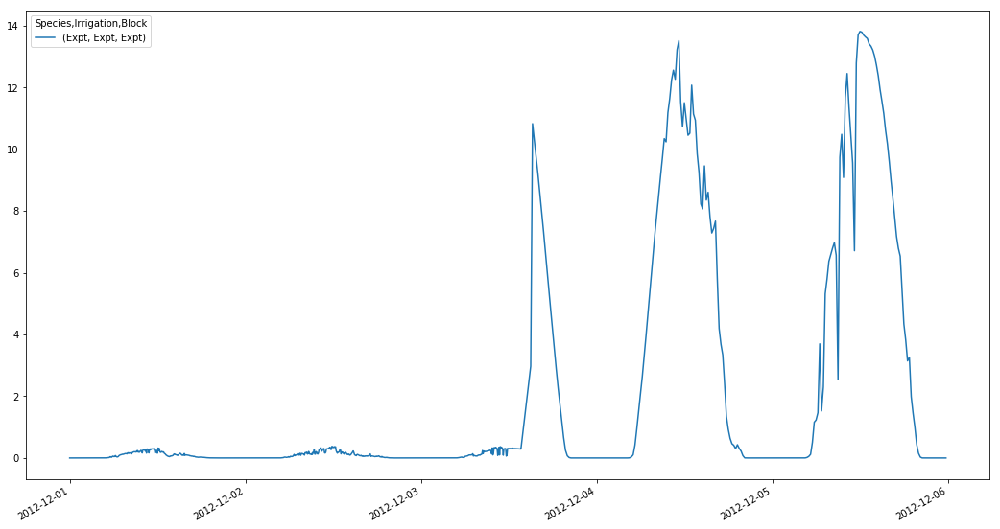

In [60]:
Data.loc['2012-12-1':'2012-12-5','IncomingRadnMJ'].plot(figsize = (18,10))

## Problem in calibration coefficient used when new program was sent to the data logger after 3pm on 3/12/2012.  Apply manual correction for this

In [61]:
Data.loc['2012-12-03 15:00:00':,'IncomingRadnMJ'] = (Data.loc['2012-12-03 15:00:00':,'IncomingRadnMJ'] * 0.069444).values

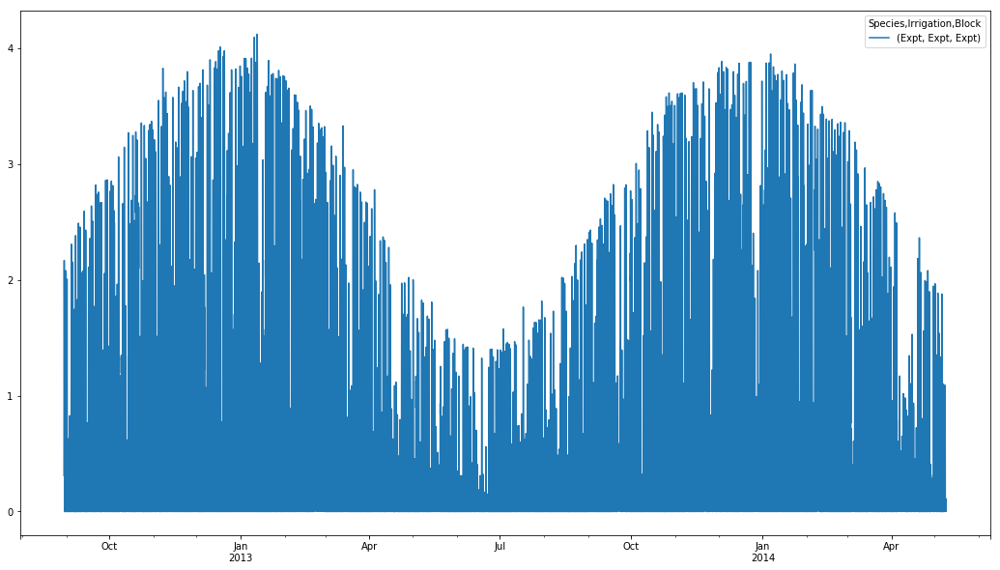

In [63]:
Data.IncomingRadnMJ.resample('H').sum().plot(figsize = (18,10))

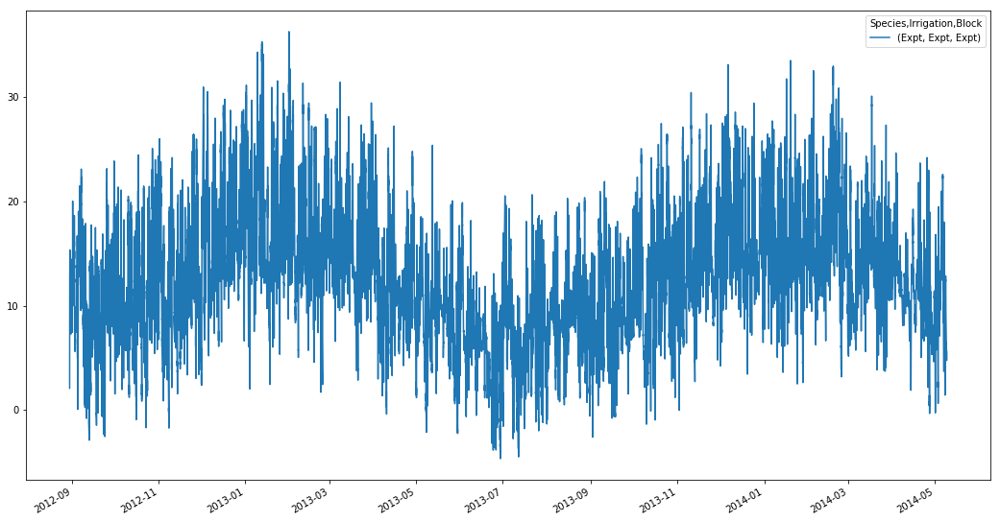

In [19]:
Data.AirTemperature.plot(figsize = (18,10))

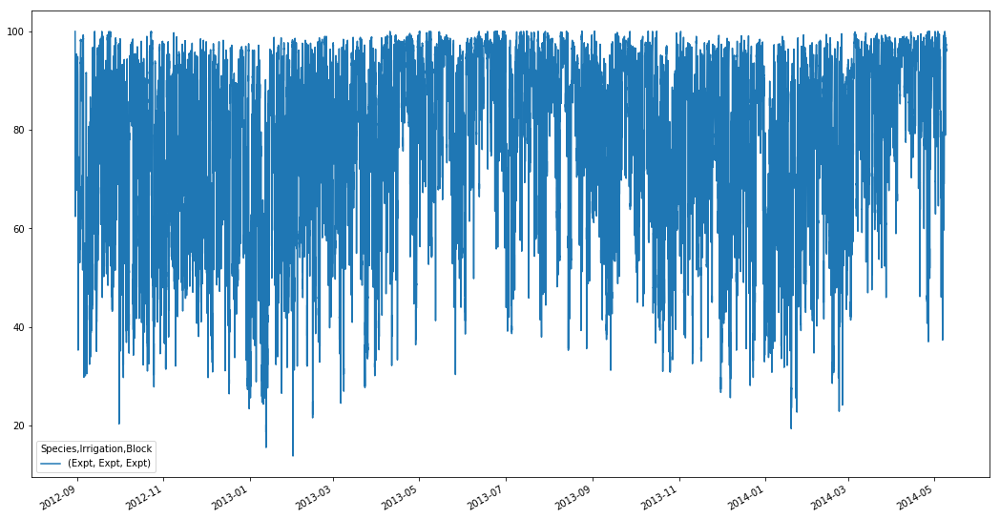

In [20]:
Data.RelativeHumidity.plot(figsize = (18,10))

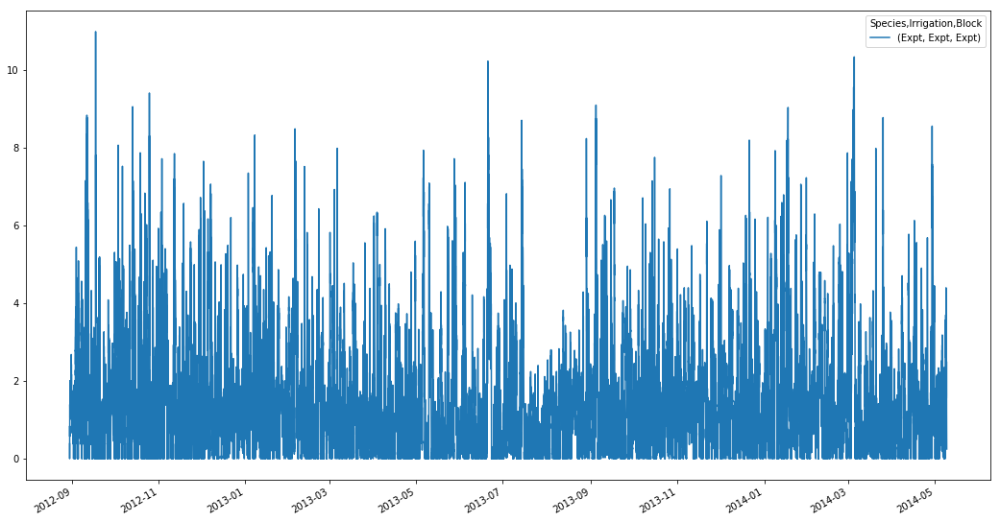

In [21]:
Data.Windspeed.plot(figsize = (18,10))

(0, 0.5)

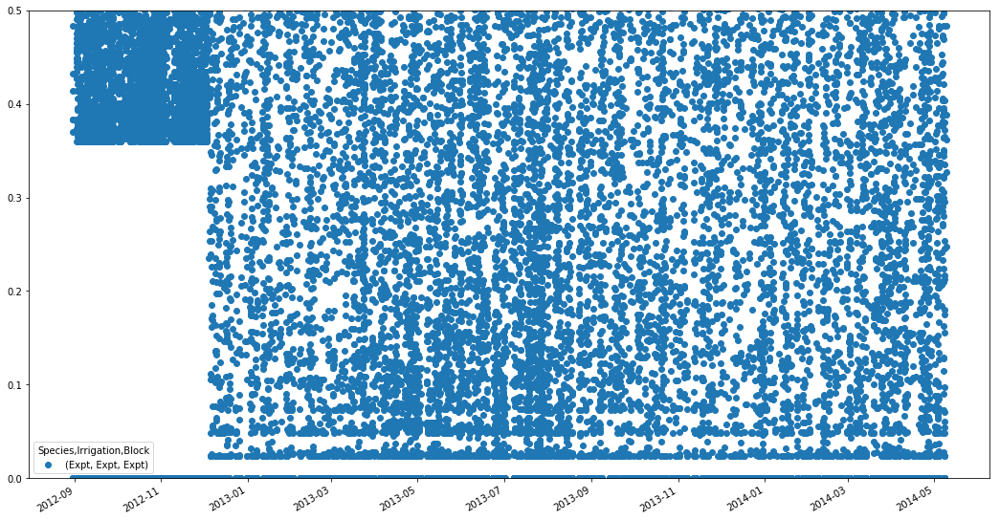

In [22]:
Data.Windspeed.plot(figsize=(18,10),style='o')
plt.plot()
plt.ylim(0,0.5)

## For some reason the wind speeds below 0.36 are not being zeroed for the bulk of the trial, zero manually

In [32]:
Data.Windspeed = Data.Windspeed.where(Data.Windspeed>0.36,0.0)

(0, 0.5)

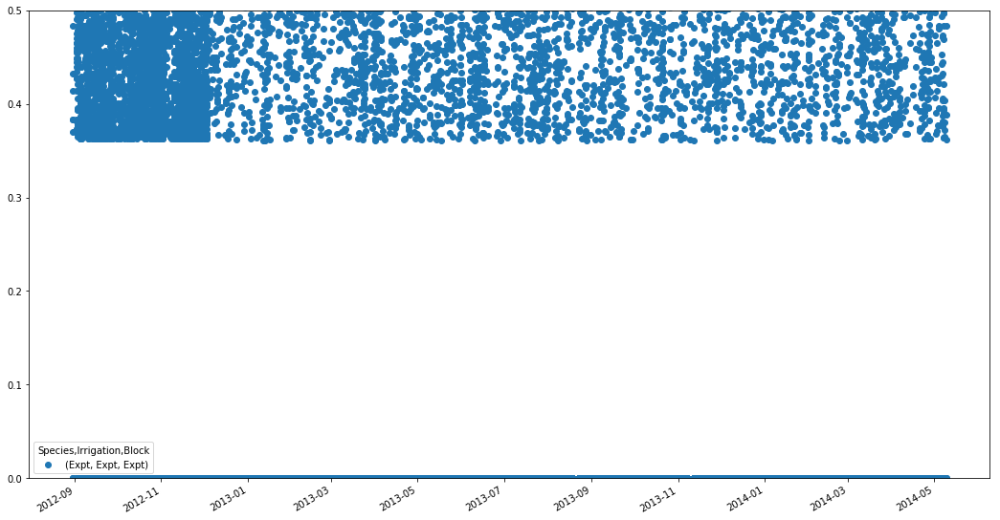

In [33]:
Data.Windspeed.plot(figsize=(18,10),style='o')
plt.plot()
plt.ylim(0,0.5)

In [65]:
Data.to_pickle('.\DataFrames\TempAndRadnCleaned.pkl')